# EDA


Setting up and importing required libraries and data files:

In [654]:
# Import packages 
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import psycopg2
import missingno as msno
import plotly.express as px


from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [655]:
# Load database connection credentials from .env file
import os
from dotenv import load_dotenv

load_dotenv()

DATABASE = os.getenv('DATABASE')
USER_DB = os.getenv('USER_DB')
PASSWORD = os.getenv('PASSWORD')
HOST = os.getenv('HOST')
PORT = os.getenv('PORT')

In [656]:
# Create connection object conn
conn = psycopg2.connect(
    database=DATABASE,
    user=USER_DB,
    password=PASSWORD,
    host=HOST,
    port=PORT
)

In [657]:
from sqlalchemy import create_engine

#read the database string from the .env
load_dotenv()

DB_STRING = os.getenv('DB_STRING')

db = create_engine(DB_STRING)

In [658]:
#import the data to a pandas dataframe and merge the two data sets into one
query_string = """SELECT * 
FROM eda.king_county_house_details kchd 
LEFT JOIN eda.king_county_house_sales kchs ON kchd.id = kchs.house_id ; """
df_king_county = pd.read_sql(query_string, db)

In [659]:
#export the data to a csv-file
df_king_county.to_csv('data/eda.csv',index=False)

In [660]:
#import the data from a csv-file
df_king_county_import = pd.read_csv('data/eda.csv')

# Gathering first insights: 
Getting a better understanding of the data sets: their variable types, data types, the shape of the data set.

In [661]:
# data columns and their respective data types
df_king_county_import.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   bedrooms       21597 non-null  float64
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  float64
 4   sqft_lot       21597 non-null  float64
 5   floors         21597 non-null  float64
 6   waterfront     19206 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  float64
 11  sqft_basement  21145 non-null  float64
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17749 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  float64
 18  sqft_l

In [662]:
# number of rows and columns
df_king_county_import.shape

(21597, 23)

In [663]:
# statistical description of the df
df_king_county_import.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price,house_id,id.1
count,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,19206.000,21534.000,21597.000,21597.000,21597.000,21145.000,21597.000,17749.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000
mean,4580474287.771,3.373,2.116,2080.322,15099.409,1.494,0.008,0.234,3.410,7.658,1788.597,291.857,1971.000,836.651,98077.952,47.560,-122.214,1986.620,12758.284,540296.574,4580474287.771,10799.000
std,2876735715.748,0.926,0.769,918.106,41412.637,0.540,0.087,0.766,0.651,1.173,827.760,442.491,29.375,4000.111,53.513,0.139,0.141,685.230,27274.442,367368.140,2876735715.748,6234.661
min,1000102.000,1.000,0.500,370.000,520.000,1.000,0.000,0.000,1.000,3.000,370.000,0.000,1900.000,0.000,98001.000,47.156,-122.519,399.000,651.000,78000.000,1000102.000,1.000
25%,2123049175.000,3.000,1.750,1430.000,5040.000,1.000,0.000,0.000,3.000,7.000,1190.000,0.000,1951.000,0.000,98033.000,47.471,-122.328,1490.000,5100.000,322000.000,2123049175.000,5400.000
50%,3904930410.000,3.000,2.250,1910.000,7618.000,1.500,0.000,0.000,3.000,7.000,1560.000,0.000,1975.000,0.000,98065.000,47.572,-122.231,1840.000,7620.000,450000.000,3904930410.000,10799.000
75%,7308900490.000,4.000,2.500,2550.000,10685.000,2.000,0.000,0.000,4.000,8.000,2210.000,560.000,1997.000,0.000,98118.000,47.678,-122.125,2360.000,10083.000,645000.000,7308900490.000,16198.000
max,9900000190.000,33.000,8.000,13540.000,1651359.000,3.500,1.000,4.000,5.000,13.000,9410.000,4820.000,2015.000,20150.000,98199.000,47.778,-121.315,6210.000,871200.000,7700000.000,9900000190.000,21597.000


In [664]:
# first 10 rows of data
df_king_county_import.head(10)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id,id.1
0,7129300520,3.000,1.000,1180.000,5650.000,1.000,NaN,0.000,3,7,1180.000,0.000,1955,0.000,98178,47.511,-122.257,1340.000,5650.000,2014-10-13,221900.000,7129300520,1
1,6414100192,3.000,2.250,2570.000,7242.000,2.000,0.000,0.000,3,7,2170.000,400.000,1951,19910.000,98125,47.721,-122.319,1690.000,7639.000,2014-12-09,538000.000,6414100192,2
2,5631500400,2.000,1.000,770.000,10000.000,1.000,0.000,0.000,3,6,770.000,0.000,1933,NaN,98028,47.738,-122.233,2720.000,8062.000,2015-02-25,180000.000,5631500400,3
3,2487200875,4.000,3.000,1960.000,5000.000,1.000,0.000,0.000,5,7,1050.000,910.000,1965,0.000,98136,47.521,-122.393,1360.000,5000.000,2014-12-09,604000.000,2487200875,4
4,1954400510,3.000,2.000,1680.000,8080.000,1.000,0.000,0.000,3,8,1680.000,0.000,1987,0.000,98074,47.617,-122.045,1800.000,7503.000,2015-02-18,510000.000,1954400510,5
5,7237550310,4.000,4.500,5420.000,101930.000,1.000,0.000,0.000,3,11,3890.000,1530.000,2001,0.000,98053,47.656,-122.005,4760.000,101930.000,2014-05-12,1230000.000,7237550310,6
6,1321400060,3.000,2.250,1715.000,6819.000,2.000,0.000,0.000,3,7,1715.000,NaN,1995,0.000,98003,47.310,-122.327,2238.000,6819.000,2014-06-27,257500.000,1321400060,7
7,2008000270,3.000,1.500,1060.000,9711.000,1.000,0.000,NaN,3,7,1060.000,0.000,1963,0.000,98198,47.410,-122.315,1650.000,9711.000,2015-01-15,291850.000,2008000270,8
8,2414600126,3.000,1.000,1780.000,7470.000,1.000,0.000,0.000,3,7,1050.000,730.000,1960,0.000,98146,47.512,-122.337,1780.000,8113.000,2015-04-15,229500.000,2414600126,9
9,3793500160,3.000,2.500,1890.000,6560.000,2.000,0.000,0.000,3,7,1890.000,0.000,2003,0.000,98038,47.368,-122.031,2390.000,7570.000,2015-03-12,323000.000,3793500160,10


In [665]:
# last 10 rows of data
df_king_county_import.tail(10)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id,id.1
21587,7852140040,3.000,2.500,2270.000,5536.000,2.000,NaN,0.000,3,8,2270.000,0.000,2003,0.000,98065,47.539,-121.881,2270.000,5731.000,2014-08-25,507250.000,7852140040,21588
21588,9834201367,3.000,2.000,1490.000,1126.000,3.000,0.000,0.000,3,8,1490.000,0.000,2014,0.000,98144,47.570,-122.288,1400.000,1230.000,2015-01-26,429000.000,9834201367,21589
21589,3448900210,4.000,2.500,2520.000,6023.000,2.000,0.000,NaN,3,9,2520.000,0.000,2014,0.000,98056,47.514,-122.167,2520.000,6023.000,2014-10-14,610685.000,3448900210,21590
21590,7936000429,4.000,3.500,3510.000,7200.000,2.000,0.000,0.000,3,9,2600.000,910.000,2009,0.000,98136,47.554,-122.398,2050.000,6200.000,2015-03-26,1010000.000,7936000429,21591
21591,2997800021,3.000,2.500,1310.000,1294.000,2.000,0.000,0.000,3,8,1180.000,130.000,2008,0.000,98116,47.577,-122.409,1330.000,1265.000,2015-02-19,475000.000,2997800021,21592
21592,263000018,3.000,2.500,1530.000,1131.000,3.000,0.000,0.000,3,8,1530.000,0.000,2009,0.000,98103,47.699,-122.346,1530.000,1509.000,2014-05-21,360000.000,263000018,21593
21593,6600060120,4.000,2.500,2310.000,5813.000,2.000,0.000,0.000,3,8,2310.000,0.000,2014,0.000,98146,47.511,-122.362,1830.000,7200.000,2015-02-23,400000.000,6600060120,21594
21594,1523300141,2.000,0.750,1020.000,1350.000,2.000,0.000,0.000,3,7,1020.000,0.000,2009,0.000,98144,47.594,-122.299,1020.000,2007.000,2014-06-23,402101.000,1523300141,21595
21595,291310100,3.000,2.500,1600.000,2388.000,2.000,NaN,0.000,3,8,1600.000,0.000,2004,0.000,98027,47.535,-122.069,1410.000,1287.000,2015-01-16,400000.000,291310100,21596
21596,1523300157,2.000,0.750,1020.000,1076.000,2.000,0.000,0.000,3,7,1020.000,0.000,2008,0.000,98144,47.594,-122.299,1020.000,1357.000,2014-10-15,325000.000,1523300157,21597


In [666]:
# check for duplicate rows
df_king_county_import.duplicated().value_counts()

False    21597
Name: count, dtype: int64

In [667]:
# number of distinct ids
df_king_county_import.id.nunique()

21420

In [668]:
# number of distinct house_ids (to check if they correspond to distinct ids)
df_king_county_import.house_id.nunique()

21420

In [669]:
# number of distinct id.1 (sales ids) (to check if they correspond to distinct ids)
df_king_county_import['id.1'].nunique()

21597

# Cleaning the data:
Some variables need to be modified in order to have a clean data set that can be used for further analysis and exploration for insights.
- rename 'id.1' into 'sales_id' to avoid punctuation in a column name
- remove 'id'(duplicate of 'house_id')
- convert 'date' to the datetime format '%Y/%m/%d'
- convert all variables with datatype 'float' to integers
- round all integers to whole numbers (except 'lat' and 'long')
- convert 'waterfront' 0 to 'No', 1 to 'Yes'

In [670]:
# renaming 'id.1' column 
df_king_county_import = df_king_county_import.rename({'id.1':'sales_id'},axis=1)
df_king_county_import.columns

Index(['id', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'date', 'price', 'house_id', 'sales_id'], dtype='object')

In [671]:
# removing 'id' column
df_king_county_import = df_king_county_import.drop(['id'],axis=1)
df_king_county_import.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'date', 'price', 'house_id', 'sales_id'], dtype='object')

In [672]:
# change 'date' column to datetime format
df_king_county_import['date'] = pd.to_datetime(df_king_county_import['date'])
df_king_county_import['date'].dtype

dtype('<M8[ns]')

In [673]:
# determine all columns with datatype 'float'
float_col_names = df_king_county_import.select_dtypes(include=['float']).columns
print(float_col_names)

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'sqft_above', 'sqft_basement', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'price'], dtype='object')


In [674]:
# removing 'lat' and 'long' from the list, as these should remain floats
float_col_names = list(float_col_names) 
float_col_names.remove('lat')
float_col_names.remove('long')
float_col_names

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'sqft_above',
 'sqft_basement',
 'yr_renovated',
 'sqft_living15',
 'sqft_lot15',
 'price']

In [675]:
for col in float_col_names:
    # Convert to numeric (coerce invalid entries to NaN)
    df_king_county_import[col] = pd.to_numeric(df_king_county_import[col], errors='coerce')
    
    # Round to nearest integer
    df_king_county_import[col] = df_king_county_import[col].round(0)
    
    # Convert to nullable integer type
    df_king_county_import[col] = df_king_county_import[col].astype('Int64')



In [676]:
# check data type of columns
df_king_county_import.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   bedrooms       21597 non-null  Int64         
 1   bathrooms      21597 non-null  Int64         
 2   sqft_living    21597 non-null  Int64         
 3   sqft_lot       21597 non-null  Int64         
 4   floors         21597 non-null  Int64         
 5   waterfront     19206 non-null  Int64         
 6   view           21534 non-null  Int64         
 7   condition      21597 non-null  int64         
 8   grade          21597 non-null  int64         
 9   sqft_above     21597 non-null  Int64         
 10  sqft_basement  21145 non-null  Int64         
 11  yr_built       21597 non-null  int64         
 12  yr_renovated   17749 non-null  Int64         
 13  zipcode        21597 non-null  int64         
 14  lat            21597 non-null  float64       
 15  long           2159

In [677]:

# Map 0 → 'No', 1 → 'Yes'
df_king_county_import['waterfront'] = df_king_county_import['waterfront'].map({0: 'No', 1: 'Yes'})

df_king_county_import['waterfront'].unique()


array([nan, 'No', 'Yes'], dtype=object)

# Handling missing Data
Some variables contain null values or are missing data and need to be handled. It is crucial to understand the data that is missing in order to know how best to handle it: dropping it or filling it based on the data available.

In [678]:
# display number of missing data per column
df_king_county_import.isna().sum()

bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2391
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     452
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
house_id            0
sales_id            0
dtype: int64

<Axes: >

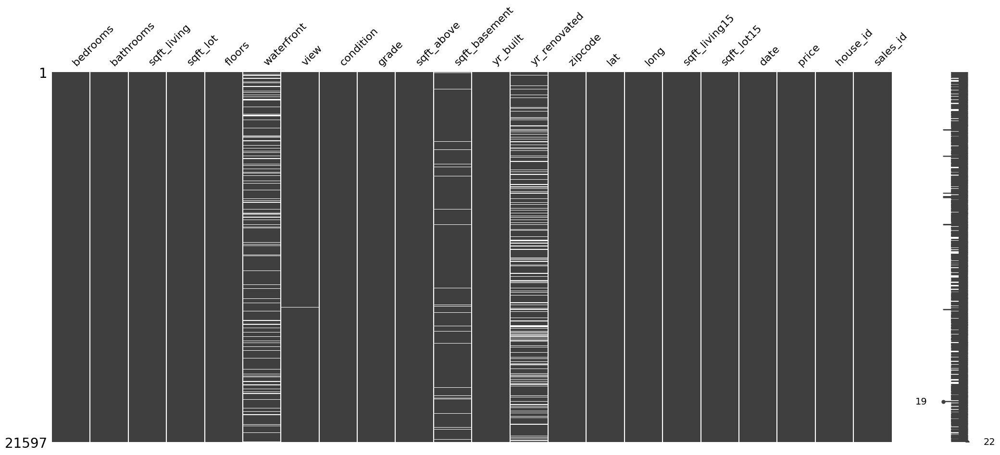

In [679]:
# display missing values in a matrix
msno.matrix(df_king_county_import)

In [680]:
# percentage of data missing
print(f"numbers of rows : {df_king_county_import.shape[0]}")
print(f"missing values in view : {round(df_king_county_import.view.isna().sum()/df_king_county_import.shape[0]*100,2)} %")
print(f"missing values in yr_renovated : {round(df_king_county_import.yr_renovated.isna().sum()/df_king_county_import.shape[0]*100,2)} %")
print(f"missing values in sqft_basement : {round(df_king_county_import.sqft_basement.isna().sum()/df_king_county_import.shape[0]*100,2)} %")
print(f"missing values in waterfront : {round(df_king_county_import.waterfront.isna().sum()/df_king_county_import.shape[0]*100,2)} %")
print(f"missing values in data frame : {round(df_king_county_import.isna().sum().sum()/(df_king_county_import.shape[0]*df_king_county_import.shape[1])*100,2)} %")


numbers of rows : 21597
missing values in view : 0.29 %
missing values in yr_renovated : 17.82 %
missing values in sqft_basement : 2.09 %
missing values in waterfront : 11.07 %
missing values in data frame : 1.42 %


## View & Sqft Basement Data:

Since 'view' and 'sqft_basement' are not relevant for my client, I will be dropping this missing data.

In [681]:
# drop all missing values for 'view'
df_king_county_import.dropna(subset=['view'], inplace=True)
print(f"missing values in view : {round(df_king_county_import.view.isna().sum()/df_king_county_import.shape[0]*100,2)} %")


missing values in view : 0.0 %


In [682]:
# drop all missing values for 'sqft_basement'
df_king_county_import.dropna(subset=['sqft_basement'], inplace=True)
print(f"missing values in sqft_basement : {round(df_king_county_import.sqft_basement.isna().sum()/df_king_county_import.shape[0]*100,2)} %")


missing values in sqft_basement : 0.0 %


## Waterfront Data:

Since waterfront data will be used in the analysis for the client, the missing data (11.07%) cannot be removed, and needs to be handled or filled in another way. The following steps will help determine how best to do this.

In [683]:
# check the number of cases for waterfront
df_king_county_import.groupby('waterfront', dropna=False).count()


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price,house_id,sales_id
waterfront,,,,,,,,,,,,,,,,,,,,,
No,18595,18595,18595,18595,18595,18595,18595,18595,18595,18595,18595,15297,18595,18595,18595,18595,18595,18595,18595,18595,18595
Yes,141,141,141,141,141,141,141,141,141,141,141,116,141,141,141,141,141,141,141,141,141
NaN,2348,2348,2348,2348,2348,2348,2348,2348,2348,2348,2348,1922,2348,2348,2348,2348,2348,2348,2348,2348,2348


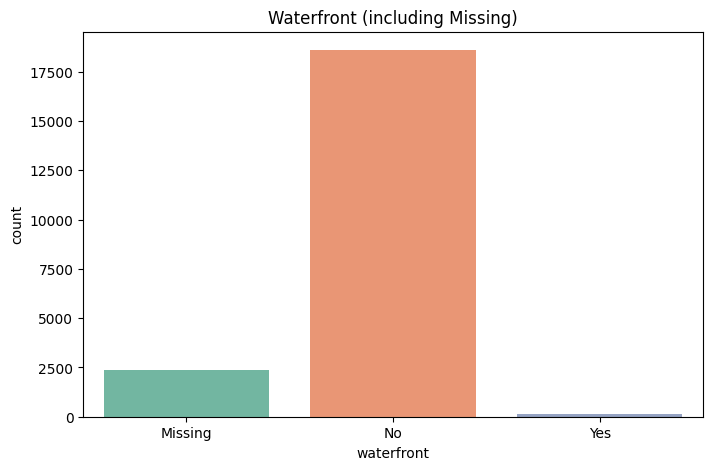

In [684]:
# checking the distribution of data missing compared to the answers (Yes/ No)
sns.countplot(
    x=df_king_county_import['waterfront'].fillna('Missing'),
    palette='Set2'
)
plt.title('Waterfront (including Missing)')
plt.show()


In [685]:
# create interactive Plotly scatterplot of waterfront data (including missing data)

fig = px.scatter_mapbox(
    df_king_county_import,
    lat="lat",
    lon="long",
    color=df_king_county_import['waterfront'].fillna('Missing'),
    hover_data={
        "price": True,
        "bedrooms": True,
        "grade": True,
        "zipcode": True,
        "waterfront": True
    },
    mapbox_style="carto-positron",
    zoom=10,
    height=600,
    title="Waterfront vs Non-Waterfront Houses (with Missing Data)"
)
fig.show()

Missing data is spread throughout the map and not concentrated in a specific area. 

Geographic proximity calculation for missing data:

By calculating the distance of each house to a known waterfront property (using long and lat coordinates), a threshold for what is considered close enough to be considered a waterfront house is calculated. All missing-value houses within this threshold distance will be labeled 'Yes'.

In [686]:
# Step 1: Reference points (all known waterfront houses)
waterfront_points = df_king_county_import[df_king_county_import['waterfront'] == 'Yes'][['lat','long']].to_numpy()

# Step 2: All house points
all_points = df_king_county_import[['lat','long']].to_numpy()

# Step 3: Build KDTree for fast nearest-neighbor lookup
tree = cKDTree(waterfront_points)

# Step 4: Compute distance to nearest waterfront for each house
distances, _ = tree.query(all_points, k=1)

# Step 5: Store distances in the dataframe
df_king_county_import['dist_to_waterfront'] = distances

In [687]:
# Data-driven threshold
threshold = np.percentile(df_king_county_import[df_king_county_import['waterfront'] == 'Yes']['dist_to_waterfront'], 75)

# Impute missing values
df_king_county_import['waterfront_imputed'] = df_king_county_import.apply(
    lambda row: row['waterfront'] if pd.notna(row['waterfront'])
    else ('Yes' if row['dist_to_waterfront'] <= threshold else 'No'),
    axis=1
)



In [688]:
# create interactive Plotly scatterplot with missing data assigned
import plotly.express as px

fig = px.scatter_mapbox(
    df_king_county_import,
    lat="lat",
    lon="long",
    color=df_king_county_import['waterfront_imputed'].fillna('Missing'),
    hover_data={
        "price": True,
        "bedrooms": True,
        "grade": True,
        "zipcode": True,
        "waterfront": True
    },
    mapbox_style="carto-positron",
    zoom=10,
    height=600,
    title="Waterfront vs Non-Waterfront Houses"
)
fig.show()


In [689]:
df_king_county_import['waterfront_imputed'].value_counts()


waterfront_imputed
No     20942
Yes      142
Name: count, dtype: int64

In [690]:
# Add the imputed waterfront values to the dataframe
df_king_county_import['waterfront_imputed'] = df_king_county_import['waterfront_imputed']

# Quick check
df_king_county_import[['waterfront', 'waterfront_imputed']].head(10)


,waterfront,waterfront_imputed
0,NaN,No
1,No,No
2,No,No
3,No,No
4,No,No
5,No,No
8,No,No
9,No,No
10,NaN,No
11,No,No


In [691]:
# check whether missing values have been allocated
print(f"missing values in waterfront_imputed : {round(df_king_county_import.waterfront_imputed.isna().sum()/df_king_county_import.shape[0]*100,2)} %")


missing values in waterfront_imputed : 0.0 %


# Year renovated

Most houses were not renovated, but contain both 'NaN' and '0' values to indicate this. As this does not allow for any insights regarding renovation, and this data is needed for the client analysis, all houses that were not renovated will be converted to 'NaN'. All renovation years with more than four digits will also be divided by 10, as they have an added zero at the end.

In [692]:
# check the number of cases for yr_renovated
df_king_county_import['yr_renovated'].describe()

count   17335.000
mean      831.354
std      3988.113
min         0.000
25%         0.000
50%         0.000
75%         0.000
max     20150.000
Name: yr_renovated, dtype: Float64

In [693]:

# 1. Ensure numeric
df_king_county_import['yr_renovated'] = pd.to_numeric(df_king_county_import['yr_renovated'], errors='coerce')

# 2. Divide by 10 only if it has more than 4 digits before the decimal (e.g., 20150.0)
df_king_county_import.loc[
    df_king_county_import['yr_renovated'].apply(lambda x: len(str(int(x))) > 4 if pd.notna(x) else False),
    'yr_renovated'
] = df_king_county_import['yr_renovated'] / 10

# 3. Replace invalid years (too small or too large)
current_year = 2025
min_valid_year = 1900
df_king_county_import.loc[
    (df_king_county_import['yr_renovated'] < min_valid_year) | 
    (df_king_county_import['yr_renovated'] > current_year),
    'yr_renovated'
] = np.nan

# 4. Replace 0 with NaN (never renovated)
df_king_county_import.loc[df_king_county_import['yr_renovated'] == 0, 'yr_renovated'] = np.nan

# 5. Round and convert to nullable integer
df_king_county_import['yr_renovated'] = df_king_county_import['yr_renovated'].round(0).astype('Int64')

# 6. Verify
print(df_king_county_import['yr_renovated'].describe())
print(df_king_county_import['yr_renovated'].head(10))


count    722.000
mean    1996.055
std       15.441
min     1934.000
25%     1987.000
50%     2000.000
75%     2007.750
max     2015.000
Name: yr_renovated, dtype: Float64
0     <NA>
1     1991
2     <NA>
3     <NA>
4     <NA>
5     <NA>
8     <NA>
9     <NA>
10    <NA>
11    <NA>
Name: yr_renovated, dtype: Int64


In [729]:
df_king_county_import.yr_renovated.describe()

count    722.000
mean    1996.055
std       15.441
min     1934.000
25%     1987.000
50%     2000.000
75%     2007.750
max     2015.000
Name: yr_renovated, dtype: Float64

# Exploring the data:
Check distributions of the continuous variables, for example by producing histograms for each of them.
Check the distributions for the categorical variables, by producing plots/tables of counts.
Look at the histograms and check for clues or patterns: can you identify groups, are the distributions skewed, do you have extreme values or outliers, where is the data centered. 

- continuous variables: ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 
                   'floors', 'sqft_above', 'sqft_basement', 'yr_built', 
                   'yr_renovated', 'lat', 'long', 'sqft_living15', 
                   'sqft_lot15', 'price']

- categorical variables: ['waterfront_imputed', 'view', 'condition', 'grade', 'zipcode']

'price', 'sqft_living', 'grade', 'condition': 

Assessing and correcting the skewness of data needed for H-testing by means of histograms, and correcting these if needed to avoid assuming normalcy in further data analysis

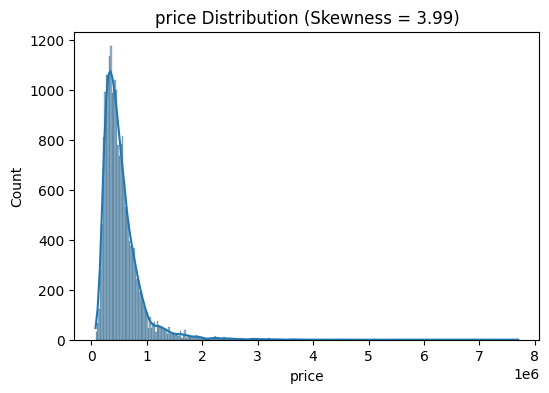

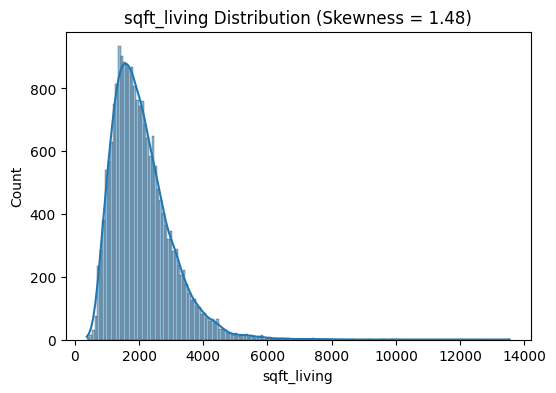

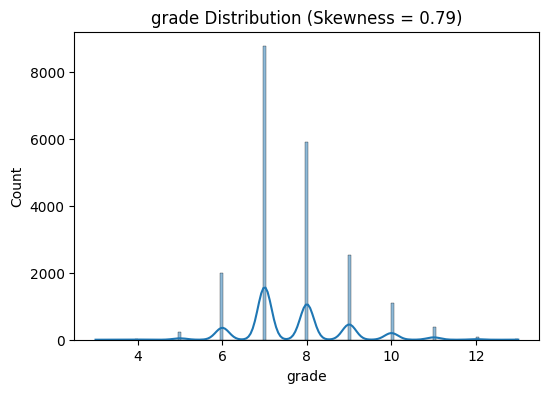

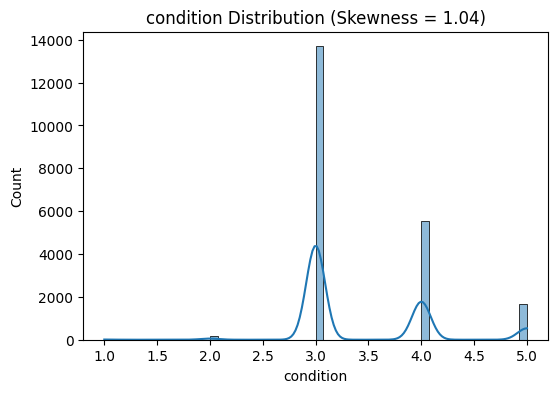

In [695]:
# assessing skewness of data for H1: 'price', 'sqft_living', 'grade', 'condition'

continuous_vars = ['price', 'sqft_living', 'grade', 'condition']

for var in continuous_vars:
    plt.figure(figsize=(6,4))
    sns.histplot(df_king_county_import[var], kde=True)
    plt.title(f'{var} Distribution (Skewness = {df_king_county_import[var].skew():.2f})')
    plt.show()


- Price and sqft_living are highly right-skewed: high outliers are expensive luxury homes 
- Grade is slightly right-skewed, but isn't extreme: most homes are average quality, with luxury homes distorting data
- Condition is highly right-skewed: most houses are in average to poor condition, with very few in excellent condition

CONDITION ANALYSIS
Mean condition: 3.41
Median condition: 3.00
Skewness: 1.04

Difference (Mean - Median): 0.41
^ Positive difference confirms right skew (mean pulled up by high values)

Condition counts:
condition
1       28
2      165
3    13690
4     5538
5     1663
Name: count, dtype: int64


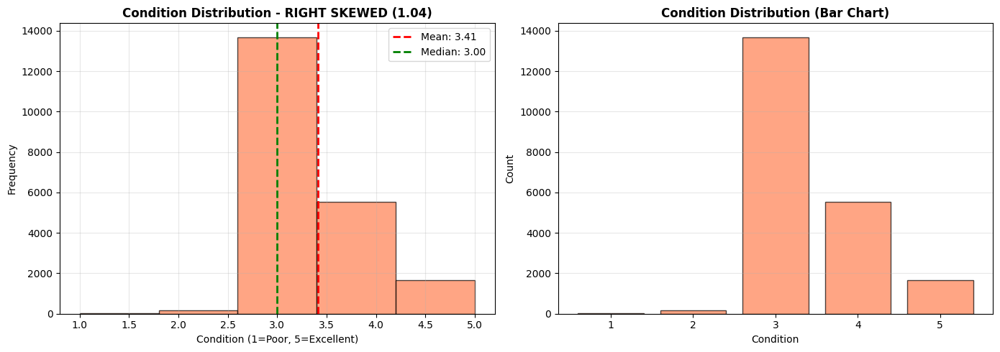

In [696]:
# visualisation of the condition skewness (right-skewed)

# Check the statistics
print("CONDITION ANALYSIS")
print("=" * 60)
print(f"Mean condition: {df_king_county_import['condition'].mean():.2f}")
print(f"Median condition: {df_king_county_import['condition'].median():.2f}")
print(f"Skewness: {df_king_county_import['condition'].skew():.2f}")
print(f"\nDifference (Mean - Median): {df_king_county_import['condition'].mean() - df_king_county_import['condition'].median():.2f}")
print("^ Positive difference confirms right skew (mean pulled up by high values)")

# Value distribution
print("\nCondition counts:")
print(df_king_county_import['condition'].value_counts().sort_index())

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
axes[0].hist(df_king_county_import['condition'], bins=5, edgecolor='black', alpha=0.7, color='coral')
axes[0].axvline(df_king_county_import['condition'].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df_king_county_import["condition"].mean():.2f}')
axes[0].axvline(df_king_county_import['condition'].median(), color='green', linestyle='--', linewidth=2, label=f'Median: {df_king_county_import["condition"].median():.2f}')
axes[0].set_title('Condition Distribution - RIGHT SKEWED (1.04)', fontweight='bold')
axes[0].set_xlabel('Condition (1=Poor, 5=Excellent)')
axes[0].set_ylabel('Frequency')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Bar chart (clearer for ordinal data)
condition_counts = df_king_county_import['condition'].value_counts().sort_index()
axes[1].bar(condition_counts.index, condition_counts.values, edgecolor='black', alpha=0.7, color='coral')
axes[1].set_title('Condition Distribution (Bar Chart)', fontweight='bold')
axes[1].set_xlabel('Condition')
axes[1].set_ylabel('Count')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

In [730]:
# creating 3 buckets to categorise the variables (rather than continuous): condition, grade, price, sqft_living
# reduces influence of extreme values
# 1. CONDITION BUCKETS
df_king_county_import['condition_bucket'] = pd.cut(
    df_king_county_import['condition'],
    bins=[0, 2, 3, 5],
    labels=['Below Average', 'Average', 'Above Average'],
    include_lowest=True
)

# 2. GRADE BUCKETS
# Grade ranges from 3-13 (construction quality)
df_king_county_import['grade_bucket'] = pd.cut(
    df_king_county_import['grade'],
    bins=[0, 6, 8, 10, 13],
    labels=['Low Quality', 'Average Quality', 'Good Quality', 'Luxury'],
    include_lowest=True
)

# 3. PRICE BUCKETS
# Create buckets based on market segments
df_king_county_import['price_bucket'] = pd.cut(
    df_king_county_import['price'],
    bins=[0, 300000, 500000, 750000, float('inf')],
    labels=['Budget (<300K)', 'Mid-Range (300-500K)', 'Premium (500-750K)', 'Luxury (>750K)'],
    include_lowest=True
)

# 4. SQFT_LIVING BUCKETS
# Based on typical home size categories
df_king_county_import['sqft_living_bucket'] = pd.cut(
    df_king_county_import['sqft_living'],
    bins=[0, 1500, 2500, 4000, float('inf')],
    labels=['Small (<1500 sqft)', 'Medium (1500-2500)', 'Large (2500-4000)', 'Very Large (>4000)'],
    include_lowest=True
)


buckets = ['condition_bucket', 'grade_bucket', 'price_bucket', 'sqft_living_bucket']

for bucket in buckets:
    print(f"\n{bucket.upper()}")
    print("-" * 60)
    counts = df_king_county_import[bucket].value_counts().sort_index()
    percentages = (counts / len(df_king_county_import) * 100).round(1)
    
    summary = pd.DataFrame({
        'Count': counts,
        'Percentage': percentages
    })
    print(summary)


CONDITION_BUCKET
------------------------------------------------------------
                  Count  Percentage
condition_bucket                   
Below Average       193       0.900
Average           13690      64.900
Above Average      7201      34.200

GRADE_BUCKET
------------------------------------------------------------
                 Count  Percentage
grade_bucket                      
Low Quality       2253      10.700
Average Quality  14687      69.700
Good Quality      3654      17.300
Luxury             490       2.300

PRICE_BUCKET
------------------------------------------------------------
                      Count  Percentage
price_bucket                           
Budget (<300K)         4449      21.100
Mid-Range (300-500K)   7812      37.100
Premium (500-750K)     5320      25.200
Luxury (>750K)         3503      16.600

SQFT_LIVING_BUCKET
------------------------------------------------------------
                    Count  Percentage
sqft_living_bucket    

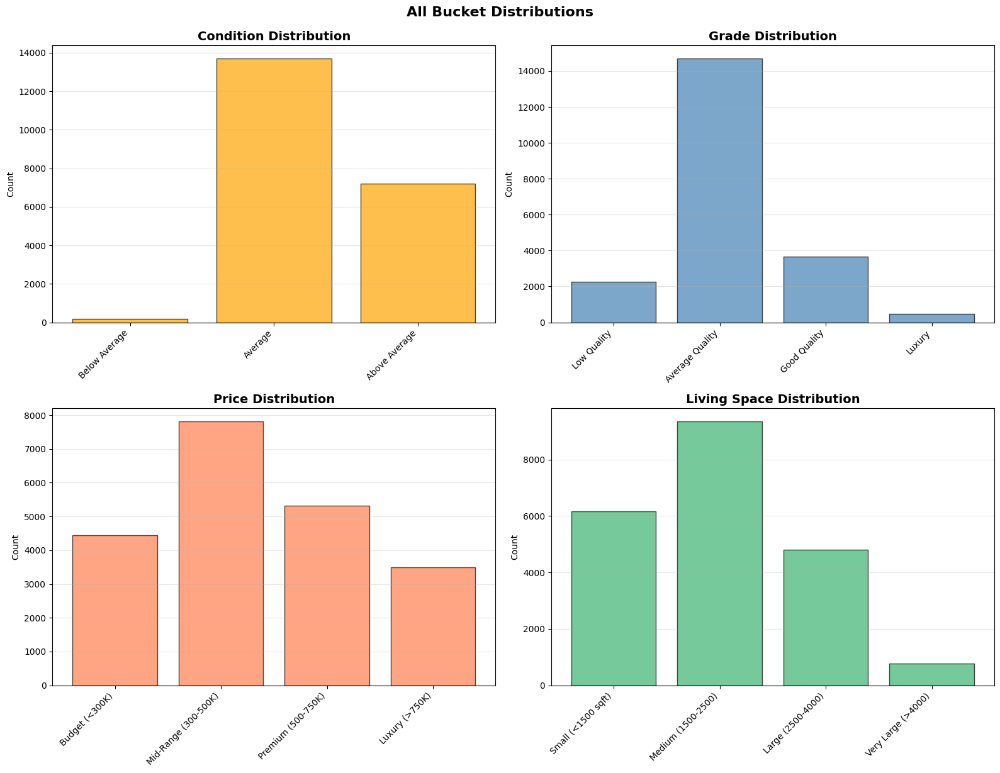

In [698]:
# visualising the newly created buckets
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# Plot 1: Condition buckets
condition_counts = df_king_county_import['condition_bucket'].value_counts().sort_index()
axes[0].bar(range(len(condition_counts)), condition_counts.values, 
            color='orange', edgecolor='black', alpha=0.7)
axes[0].set_xticks(range(len(condition_counts)))
axes[0].set_xticklabels(condition_counts.index, rotation=45, ha='right')
axes[0].set_title('Condition Distribution', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Count')
axes[0].grid(True, alpha=0.3, axis='y')

# Plot 2: Grade buckets
grade_counts = df_king_county_import['grade_bucket'].value_counts().sort_index()
axes[1].bar(range(len(grade_counts)), grade_counts.values, 
            color='steelblue', edgecolor='black', alpha=0.7)
axes[1].set_xticks(range(len(grade_counts)))
axes[1].set_xticklabels(grade_counts.index, rotation=45, ha='right')
axes[1].set_title('Grade Distribution', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Count')
axes[1].grid(True, alpha=0.3, axis='y')

# Plot 3: Price buckets
price_counts = df_king_county_import['price_bucket'].value_counts().sort_index()
axes[2].bar(range(len(price_counts)), price_counts.values, 
            color='coral', edgecolor='black', alpha=0.7)
axes[2].set_xticks(range(len(price_counts)))
axes[2].set_xticklabels(price_counts.index, rotation=45, ha='right')
axes[2].set_title('Price Distribution', fontsize=14, fontweight='bold')
axes[2].set_ylabel('Count')
axes[2].grid(True, alpha=0.3, axis='y')

# Plot 4: Sqft Living buckets
sqft_counts = df_king_county_import['sqft_living_bucket'].value_counts().sort_index()
axes[3].bar(range(len(sqft_counts)), sqft_counts.values, 
            color='mediumseagreen', edgecolor='black', alpha=0.7)
axes[3].set_xticks(range(len(sqft_counts)))
axes[3].set_xticklabels(sqft_counts.index, rotation=45, ha='right')
axes[3].set_title('Living Space Distribution', fontsize=14, fontweight='bold')
axes[3].set_ylabel('Count')
axes[3].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.suptitle('All Bucket Distributions', fontsize=16, fontweight='bold', y=1.02)
plt.show()

# Relationships in the data

Compute the correlation matrix and plot it.
Check the relationships between the values in your hypothesis and the targe (price).

HP 1: houses with a high grade and good condition have the highest price

In [744]:
df_king_county_import['price'].describe()

count     21084.000
mean     540274.872
std      366719.888
min       78000.000
25%      322000.000
50%      450000.000
75%      645000.000
max     7700000.000
Name: price, dtype: Float64

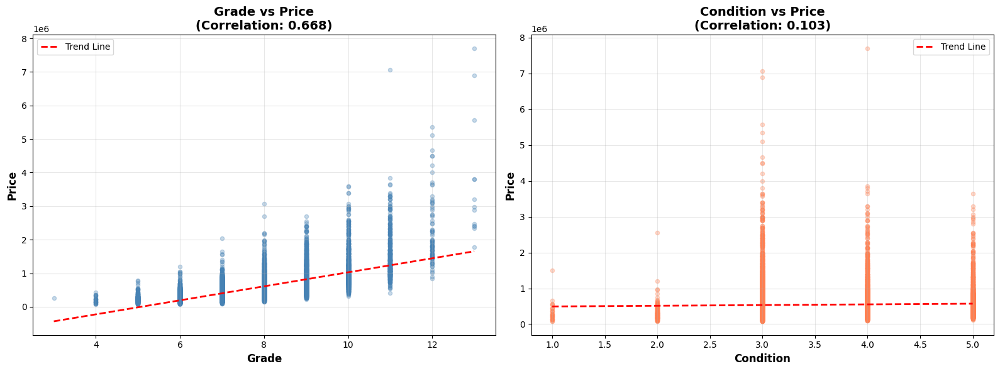

In [745]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scatter plot: Grade vs Price
axes[0].scatter(df_king_county_import['grade'], 
                df_king_county_import['price'],
                alpha=0.3, s=20, color='steelblue')

# Add trend line
z = np.polyfit(df_king_county_import['grade'].dropna(), 
               df_king_county_import['price'].dropna(), 1)
p = np.poly1d(z)
axes[0].plot(df_king_county_import['grade'].sort_values(), 
             p(df_king_county_import['grade'].sort_values()), 
             "r--", linewidth=2, label=f'Trend Line')

axes[0].set_xlabel('Grade', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Price', fontsize=12, fontweight='bold')
axes[0].set_title(f'Grade vs Price\n(Correlation: {df_king_county_import["grade"].corr(df_king_county_import["price"]):.3f})', 
                  fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3)
axes[0].legend()

# Scatter plot: Condition vs Price per sqm
axes[1].scatter(df_king_county_import['condition'], 
                df_king_county_import['price'],
                alpha=0.3, s=20, color='coral')

# Add trend line
z = np.polyfit(df_king_county_import['condition'].dropna(), 
               df_king_county_import['price'].dropna(), 1)
p = np.poly1d(z)
axes[1].plot(df_king_county_import['condition'].sort_values(), 
             p(df_king_county_import['condition'].sort_values()), 
             "r--", linewidth=2, label=f'Trend Line')

axes[1].set_xlabel('Condition', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Price', fontsize=12, fontweight='bold')
axes[1].set_title(f'Condition vs Price\n(Correlation: {df_king_county_import["condition"].corr(df_king_county_import["price_per_sqft"]):.3f})', 
                  fontsize=14, fontweight='bold')
axes[1].grid(True, alpha=0.3)
axes[1].legend()

plt.tight_layout()
plt.show()


Grade shows a strong positive correlation to price, whilst condition has a weak positive correlation. A higher grade is a much better indicator for a high price.

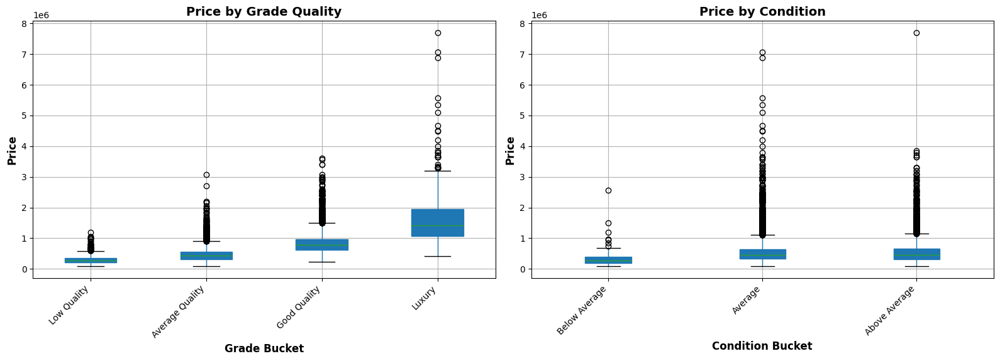

In [746]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Box plot: Grade buckets vs Price
df_king_county_import.boxplot(column='price', 
                               by='grade_bucket', 
                               ax=axes[0],
                               patch_artist=True)

axes[0].set_xlabel('Grade Bucket', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Price', fontsize=12, fontweight='bold')
axes[0].set_title('Price by Grade Quality', fontsize=14, fontweight='bold')
axes[0].get_figure().suptitle('')  # Remove default title
plt.setp(axes[0].xaxis.get_majorticklabels(), rotation=45, ha='right')

# Box plot: Condition buckets vs Price 
df_king_county_import.boxplot(column='price', 
                               by='condition_bucket', 
                               ax=axes[1],
                               patch_artist=True)
axes[1].set_xlabel('Condition Bucket', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Price', fontsize=12, fontweight='bold')
axes[1].set_title('Price by Condition', fontsize=14, fontweight='bold')
axes[1].get_figure().suptitle('')  # Remove default title
plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

Grade: 
- positive correlation (median line moves up)
- luxury houses show huge variation: wider spread for luxury (taller box) --> some luxury houses are expensive, some moderately so 
- stronger drive of price

Condition:
- weaker positive correlation (smaller difference in median)
- outlier spread overlaps more, less distinct separation between groups
- only extreme luxury houses show high outliers for above average condition

In [702]:
# determine correlation coefficient (r) and p-value
from scipy.stats import pearsonr

r_grade, p_grade = pearsonr(df_king_county_import['price_per_sqft'], df_king_county_import['grade'])
r_condition, p_condition = pearsonr(df_king_county_import['price_per_sqft'], df_king_county_import['condition'])

print(f"Grade correlation: r = {r_grade:.3f}, p = {p_grade:.5f}")
print(f"Condition correlation: r = {r_condition:.3f}, p = {p_condition:.5f}")


Grade correlation: r = 0.124, p = 0.00000
Condition correlation: r = 0.103, p = 0.00000


In [738]:
# Filter for high grade, high condition, waterfront homes
high_quality_waterfront = df_king_county_import[
    (df_king_county_import['grade'] >= df_king_county_import['grade'].max() - 1) &  # top grade homes
    (df_king_county_import['condition'] >= df_king_county_import['condition'].max() - 1) &  # top condition
    (df_king_county_import['waterfront_imputed'] == 'Yes')
]

# Calculate the mean price
estimated_price = high_quality_waterfront['price'].mean()

print(f"Estimated price for high grade, high condition waterfront homes: ${estimated_price:,.0f}")




Estimated price for high grade, high condition waterfront homes: $2,665,000


In [740]:
# Calculate mean grade and condition
mean_grade = df_king_county_import['grade'].mean()
mean_condition = df_king_county_import['condition'].mean()

# Filter waterfront homes with above-average grade and average condition
waterfront_selected = df_king_county_import[
    (df_king_county_import['waterfront_imputed'] == 'Yes') &
    (df_king_county_import['grade'] > mean_grade) &
    (df_king_county_import['condition'].between(mean_condition - 0.5, mean_condition + 0.5))  # allowing small range around mean
]

# Calculate average price
average_price = waterfront_selected['price'].mean()

print(f"Average price for waterfront homes with above-average grade and average condition: ${average_price:,.0f}")


Average price for waterfront homes with above-average grade and average condition: $2,100,935


Weak positive correlation, p-value indicates statistically significant correlation.

Waterfront houses with a high condition sell for around $500,000 more than those same houses with an above average condition, indicating the profit margin opportunity for renovations.

Luxury Waterfront - Average condition: 20 homes
Luxury Waterfront - Above Average condition: 8 homes

RENOVATION IMPACT ON LUXURY WATERFRONT HOMES

Average Condition Mean: $2,912,000
Above Average Condition Mean: $3,271,250
Profit Margin (Mean): $359,250 (12.3% increase)

Average Condition Median: $2,455,000
Above Average Condition Median: $3,300,000
Profit Margin (Median): $845,000 (34.4% increase)


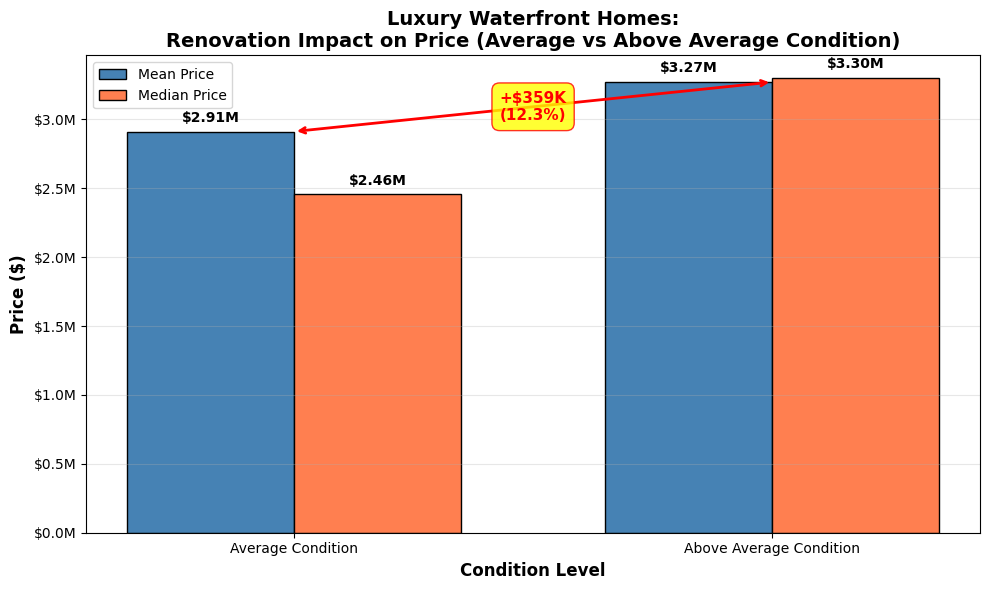

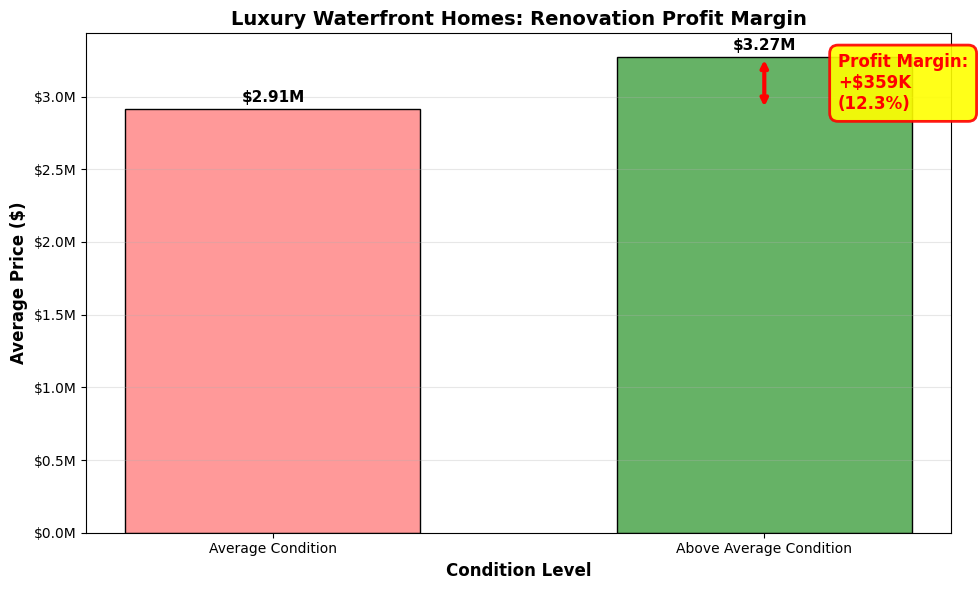

In [ ]:

# Luxury waterfront with Average condition
luxury_wf_avg = df_king_county_import[
    (df_king_county_import['grade_bucket'] == 'Luxury') &
    (df_king_county_import['waterfront_imputed'] == 'Yes') &
    (df_king_county_import['condition_bucket'] == 'Average')
]

# Luxury waterfront with Above Average condition
luxury_wf_above = df_king_county_import[
    (df_king_county_import['grade_bucket'] == 'Luxury') &
    (df_king_county_import['waterfront_imputed'] == 'Yes') &
    (df_king_county_import['condition_bucket'] == 'Above Average')
]

print(f"Luxury Waterfront - Average condition: {len(luxury_wf_avg)} homes")
print(f"Luxury Waterfront - Above Average condition: {len(luxury_wf_above)} homes")

# Calculate mean and median prices
avg_condition_mean = luxury_wf_avg['price'].mean()
above_avg_condition_mean = luxury_wf_above['price'].mean()

avg_condition_median = luxury_wf_avg['price'].median()
above_avg_condition_median = luxury_wf_above['price'].median()

# Calculate profit margin (renovation impact)
profit_margin_mean = above_avg_condition_mean - avg_condition_mean
profit_margin_pct_mean = ((above_avg_condition_mean / avg_condition_mean) - 1) * 100

profit_margin_median = above_avg_condition_median - avg_condition_median
profit_margin_pct_median = ((above_avg_condition_median / avg_condition_median) - 1) * 100

print("\n" + "=" * 60)
print("RENOVATION IMPACT ON LUXURY WATERFRONT HOMES")
print("=" * 60)
print(f"\nAverage Condition Mean: ${avg_condition_mean:,.0f}")
print(f"Above Average Condition Mean: ${above_avg_condition_mean:,.0f}")
print(f"Profit Margin (Mean): ${profit_margin_mean:,.0f} ({profit_margin_pct_mean:.1f}% increase)")

print(f"\nAverage Condition Median: ${avg_condition_median:,.0f}")
print(f"Above Average Condition Median: ${above_avg_condition_median:,.0f}")
print(f"Profit Margin (Median): ${profit_margin_median:,.0f} ({profit_margin_pct_median:.1f}% increase)")


fig, ax = plt.subplots(figsize=(10, 6))

categories = ['Average Condition', 'Above Average Condition']
means = [avg_condition_mean, above_avg_condition_mean]
medians = [avg_condition_median, above_avg_condition_median]

x = [0, 1]
width = 0.35

bars1 = ax.bar([i - width/2 for i in x], means, width, label='Mean Price', color='steelblue', edgecolor='black')
bars2 = ax.bar([i + width/2 for i in x], medians, width, label='Median Price', color='coral', edgecolor='black')

ax.set_xlabel('Condition Level', fontsize=12, fontweight='bold')
ax.set_ylabel('Price ($)', fontsize=12, fontweight='bold')
ax.set_title('Luxury Waterfront Homes:\nRenovation Impact on Price (Average vs Above Average Condition)', 
             fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M'))
ax.legend()
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar in bars1:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 50000,
            f'${height/1e6:.2f}M', ha='center', va='bottom', fontsize=10, fontweight='bold')

for bar in bars2:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 50000,
            f'${height/1e6:.2f}M', ha='center', va='bottom', fontsize=10, fontweight='bold')

# Add profit margin annotation
mid_point = 0.5
arrow_y = (means[0] + means[1]) / 2
ax.annotate('', xy=(1, means[1]), xytext=(0, means[0]),
            arrowprops=dict(arrowstyle='<->', color='red', lw=2))
ax.text(mid_point, arrow_y, f'+${profit_margin_mean/1e3:.0f}K\n({profit_margin_pct_mean:.1f}%)',
        ha='center', va='center', fontsize=11, fontweight='bold', color='red',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.8, edgecolor='red'))

plt.tight_layout()
plt.show()

# ============================================
# ALTERNATIVE: SIMPLE BAR CHART WITH PROFIT MARGIN
# ============================================

fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.bar(categories, means, color=['#FF9999', '#66B266'], edgecolor='black', width=0.6)

ax.set_xlabel('Condition Level', fontsize=12, fontweight='bold')
ax.set_ylabel('Average Price ($)', fontsize=12, fontweight='bold')
ax.set_title('Luxury Waterfront Homes: Renovation Profit Margin', fontsize=14, fontweight='bold')
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M'))
ax.grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for i, (bar, mean) in enumerate(zip(bars, means)):
    ax.text(i, mean + 50000, f'${mean/1e6:.2f}M', ha='center', fontweight='bold', fontsize=11)

# Add profit margin arrow and label
ax.annotate('', xy=(1, above_avg_condition_mean), xytext=(1, avg_condition_mean),
            arrowprops=dict(arrowstyle='<->', color='red', lw=3))
ax.text(1.15, (avg_condition_mean + above_avg_condition_mean) / 2, 
        f'Profit Margin:\n+${profit_margin_mean/1e3:.0f}K\n({profit_margin_pct_mean:.1f}%)',
        ha='left', va='center', fontsize=12, fontweight='bold', color='red',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.9, edgecolor='red', linewidth=2))

plt.tight_layout()
plt.show()

HP 2: waterfront houses are newer (built more recently)

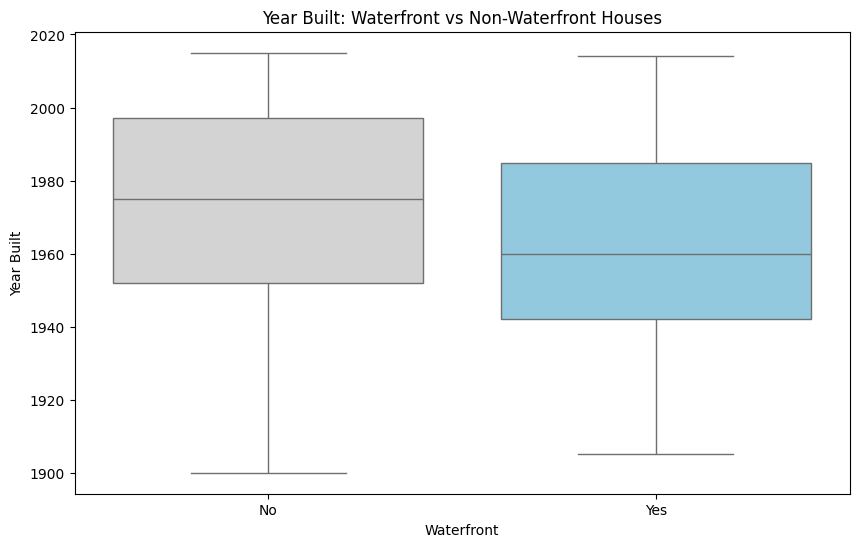

In [704]:
plt.figure(figsize=(10,6))
sns.boxplot(x='waterfront_imputed', y='yr_built', 
            data=df_king_county_import, palette=['lightgray','skyblue'])
plt.xlabel('Waterfront')
plt.ylabel('Year Built')
plt.title('Year Built: Waterfront vs Non-Waterfront Houses')
plt.show()


Waterfront houses have a slightly lower mean, ie. are built slightly earlier than non-waterfront houses (tend to be more historic on waterfront)

  waterfront_imputed  pct_renovated
0                 No          3.319
1                Yes         19.014


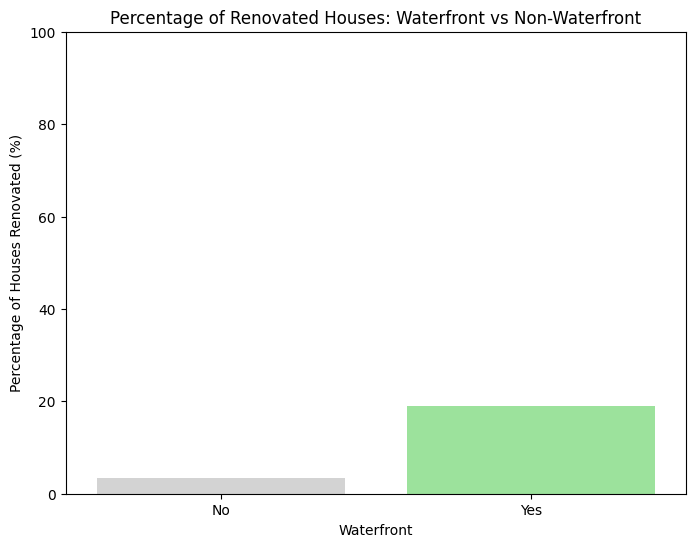

In [705]:
# 1 if renovated, 0 if never
df_king_county_import['renovated'] = df_king_county_import['yr_renovated'].notna().astype(int)

# Count total houses and number renovated per category
total_counts = df_king_county_import.groupby('waterfront_imputed')['renovated'].count()
renovated_counts = df_king_county_import.groupby('waterfront_imputed')['renovated'].sum()

# Calculate percentage
pct_renovated = (renovated_counts / total_counts * 100).reset_index()
pct_renovated.columns = ['waterfront_imputed', 'pct_renovated']
print(pct_renovated)

plt.figure(figsize=(8,6))
sns.barplot(x='waterfront_imputed', y='pct_renovated', data=pct_renovated,
            palette=['lightgray','lightgreen'])
plt.xlabel('Waterfront')
plt.ylabel('Percentage of Houses Renovated (%)')
plt.title('Percentage of Renovated Houses: Waterfront vs Non-Waterfront')
plt.ylim(0, 100)
plt.show()




Waterfront houses tend to be renovated more so than non-waterfront houses

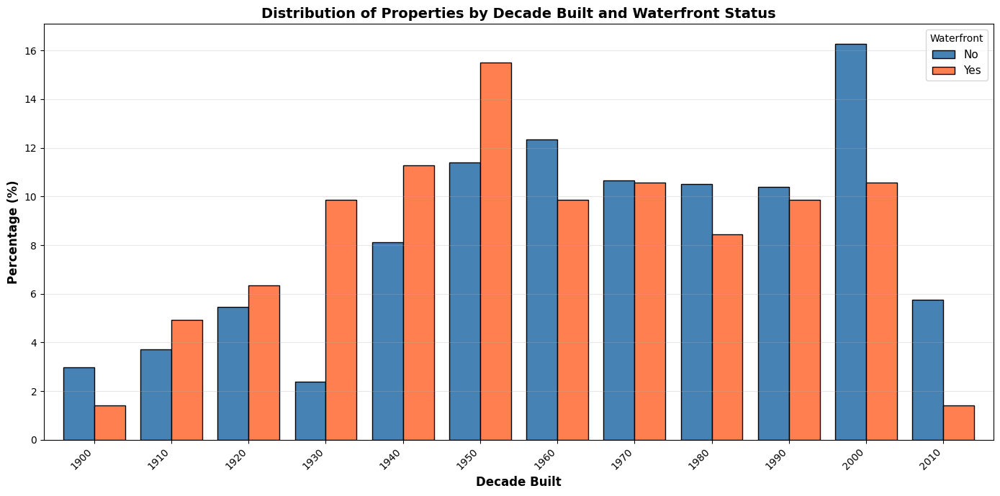


DECADE DISTRIBUTION
waterfront_imputed     No    Yes
decade_built                    
1900                3.000  1.400
1910                3.700  4.900
1920                5.500  6.300
1930                2.400  9.900
1940                8.100 11.300
1950               11.400 15.500
1960               12.400  9.900
1970               10.700 10.600
1980               10.500  8.500
1990               10.400  9.900
2000               16.300 10.600
2010                5.700  1.400


In [706]:
# Create decade bins
df_king_county_import['decade_built'] = (df_king_county_import['yr_built'] // 10) * 10

# Count by decade and waterfront
decade_counts = pd.crosstab(df_king_county_import['decade_built'], 
                            df_king_county_import['waterfront_imputed'],
                            normalize='columns') * 100

# Plot
fig, ax = plt.subplots(figsize=(14, 7))
decade_counts.plot(kind='bar', ax=ax, color=['steelblue', 'coral'], edgecolor='black', width=0.8)
ax.set_xlabel('Decade Built', fontsize=12, fontweight='bold')
ax.set_ylabel('Percentage (%)', fontsize=12, fontweight='bold')
ax.set_title('Distribution of Properties by Decade Built and Waterfront Status', fontsize=14, fontweight='bold')
ax.legend(title='Waterfront', fontsize=11)
ax.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print("\n" + "=" * 80)
print("DECADE DISTRIBUTION")
print("=" * 80)
print(decade_counts.round(1))



Waterfront houses were built around 1930-1950 (historic houses)

In [707]:
# Convert waterfront to numeric
df_king_county_import['waterfront_numeric'] = df_king_county_import['waterfront_imputed'].map({'No': 0, 'Yes': 1})

# Calculate Pearson correlation
corr = df_king_county_import['yr_built'].corr(df_king_county_import['waterfront_numeric'])
print(f"Correlation between Year Built and Waterfront: {corr:.3f}")

Correlation between Year Built and Waterfront: -0.024


Slightly negative correlation, ie. not strong enough to support the hypothesis.

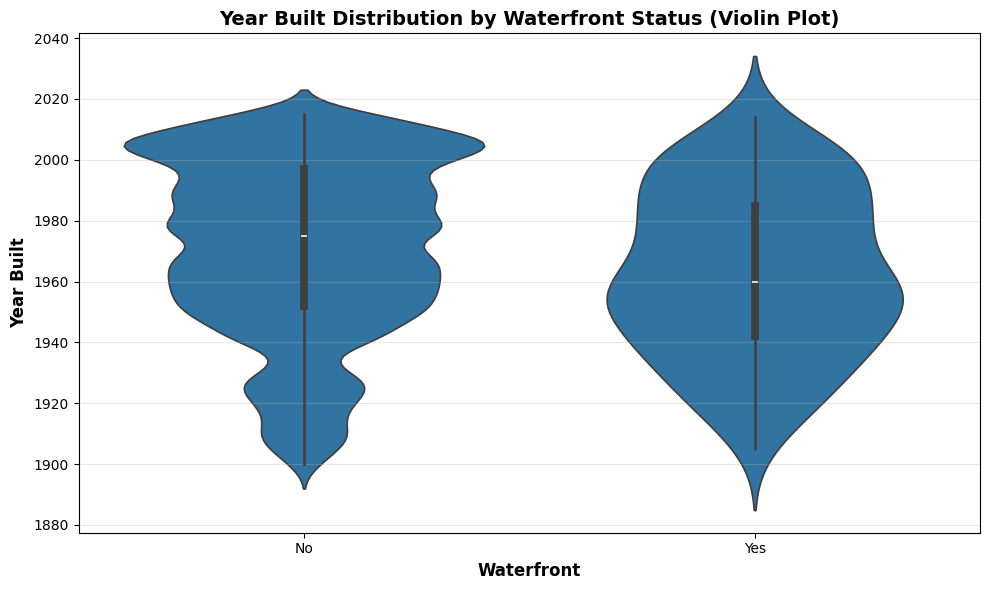

In [708]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(data=df_king_county_import, x='waterfront_imputed', y='yr_built', ax=ax)
ax.set_xlabel('Waterfront', fontsize=12, fontweight='bold')
ax.set_ylabel('Year Built', fontsize=12, fontweight='bold')
ax.set_title('Year Built Distribution by Waterfront Status (Violin Plot)', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

print("\n" + "=" * 80)


Waterfront houses tend to be built longer ago and are older (hsistoric)

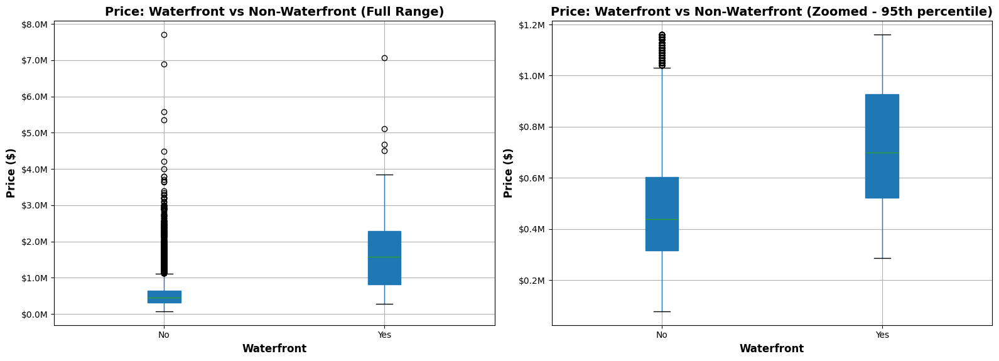

In [709]:
# looking at impact of waterfront location on price

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Box plot - Full price range
df_king_county_import.boxplot(column='price', 
                              by='waterfront_imputed', 
                              ax=axes[0],
                              patch_artist=True)
axes[0].set_xlabel('Waterfront', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Price ($)', fontsize=12, fontweight='bold')
axes[0].set_title('Price: Waterfront vs Non-Waterfront (Full Range)', fontsize=14, fontweight='bold')
axes[0].get_figure().suptitle('')
axes[0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M'))

# Box plot - Zoomed in (remove extreme outliers for clarity)
price_cap = df_king_county_import['price'].quantile(0.95)
df_zoomed = df_king_county_import[df_king_county_import['price'] <= price_cap]
df_zoomed.boxplot(column='price', 
                  by='waterfront_imputed', 
                  ax=axes[1],
                  patch_artist=True)
axes[1].set_xlabel('Waterfront', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Price ($)', fontsize=12, fontweight='bold')
axes[1].set_title('Price: Waterfront vs Non-Waterfront (Zoomed - 95th percentile)', fontsize=14, fontweight='bold')
axes[1].get_figure().suptitle('')
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M'))

plt.tight_layout()
plt.show()



The majority of luxury houses (high price) are at the waterfront

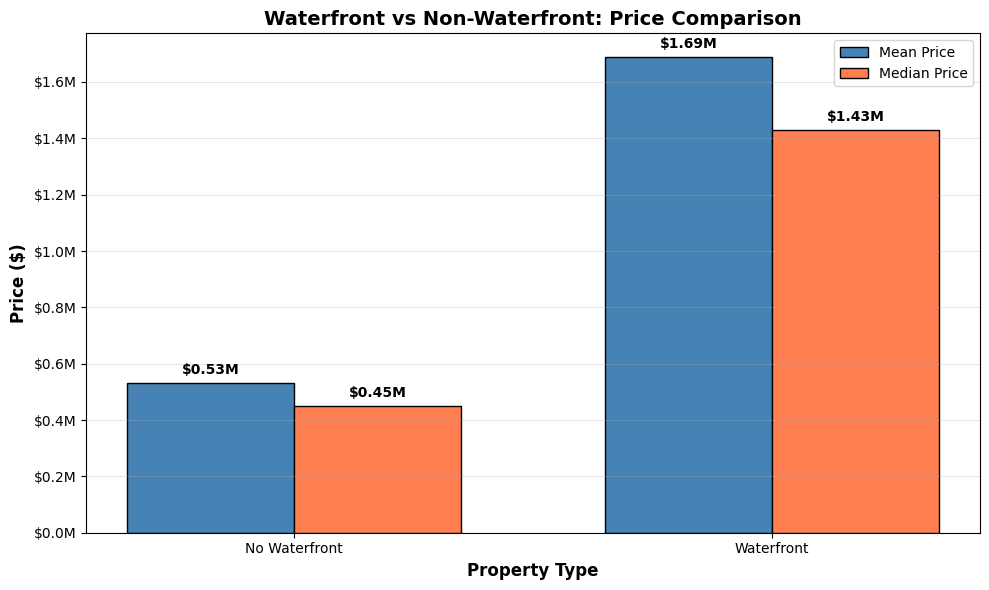

In [710]:
# price comparison of waterfront houses versus non-waterfront houses
fig, ax = plt.subplots(figsize=(10, 6))

x = [0, 1]
width = 0.35

bars1 = ax.bar([i - width/2 for i in x], means, width, label='Mean Price', color='steelblue', edgecolor='black')
bars2 = ax.bar([i + width/2 for i in x], medians, width, label='Median Price', color='coral', edgecolor='black')

ax.set_xlabel('Property Type', fontsize=12, fontweight='bold')
ax.set_ylabel('Price ($)', fontsize=12, fontweight='bold')
ax.set_title('Waterfront vs Non-Waterfront: Price Comparison', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M'))
ax.legend()
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar in bars1:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 20000,
            f'${height/1e6:.2f}M', ha='center', va='bottom', fontsize=10, fontweight='bold')

for bar in bars2:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 20000,
            f'${height/1e6:.2f}M', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

Waterfront houses have a far higher mean and median price, and comprise most of the outlier data

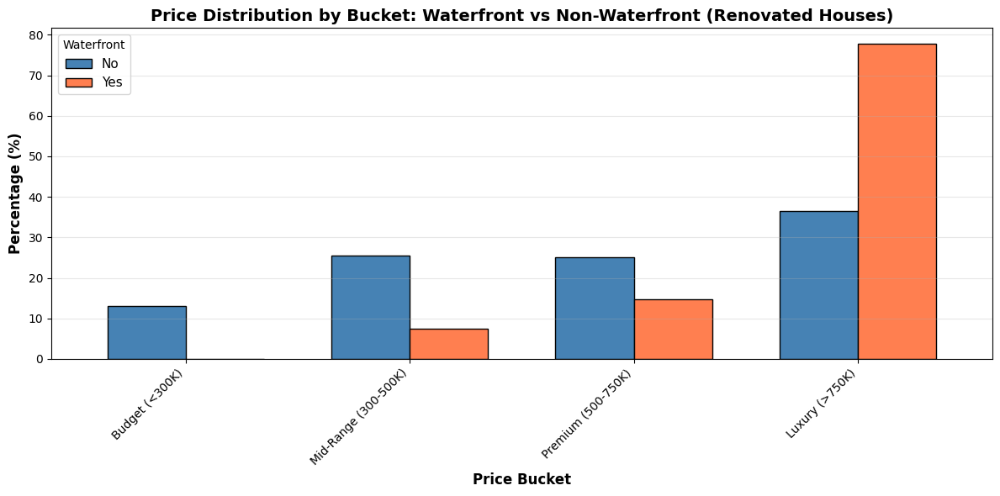

In [711]:
# Filter only renovated houses
df_renovated = df_king_county_import[df_king_county_import['yr_renovated'].notna() & 
                                     (df_king_county_import['yr_renovated'] != 0)]

# Create the figure
fig, ax = plt.subplots(figsize=(12, 6))

# Crosstab for renovated houses
price_bucket_crosstab = pd.crosstab(
    df_renovated['waterfront_imputed'],
    df_renovated['price_bucket'],
    normalize='index'
) * 100

# Plot
price_bucket_crosstab.T.plot(kind='bar', ax=ax, color=['steelblue', 'coral'], edgecolor='black', width=0.7)
ax.set_xlabel('Price Bucket', fontsize=12, fontweight='bold')
ax.set_ylabel('Percentage (%)', fontsize=12, fontweight='bold')
ax.set_title('Price Distribution by Bucket: Waterfront vs Non-Waterfront (Renovated Houses)', fontsize=14, fontweight='bold')
ax.legend(title='Waterfront', fontsize=11)
ax.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Renovated houses at the waterfront have the highest prices (largest profit margin)

In [712]:
# Start from the DataFrame
df = df_king_county_import.copy()

# Create renovated status column
df['renovated_status'] = df['yr_renovated'].apply(lambda x: 'yes' if pd.notna(x) and x != 0 else 'no')

# Filter for waterfront homes (capitalized 'Yes')
waterfront_homes = df[df['waterfront_imputed'] == 'Yes']

print("Total waterfront homes:", len(waterfront_homes))  # Should be 146

# Identify luxury waterfront homes using top 10% of price
luxury_waterfront = waterfront_homes[
    waterfront_homes['price'] >= waterfront_homes['price'].quantile(0.9)
]

print("Luxury waterfront homes:", len(luxury_waterfront))

# Separate by renovated status
renovated_mean = round(renovated['price'].mean())
not_renovated_mean = round(not_renovated['price'].mean())

print("Renovated luxury waterfront mean price:", renovated_mean)
print("Not renovated luxury waterfront mean price:", not_renovated_mean)

Total waterfront homes: 142
Luxury waterfront homes: 15
Renovated luxury waterfront mean price: 4657500
Not renovated luxury waterfront mean price: 3718182


Luxury homes that are renovated have a higher price than those that are not

renovated_status
Not Renovated    115
Renovated         27
Name: count, dtype: int64


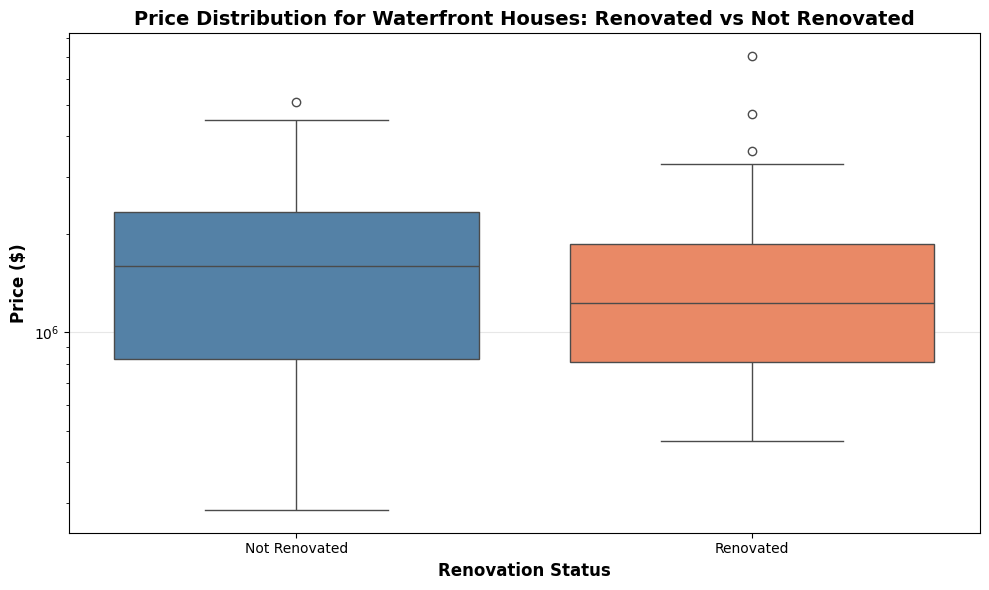

In [713]:
# Filter only waterfront houses ('Yes')
df_waterfront = df_king_county_import[df_king_county_import['waterfront_imputed'] == 'Yes'].copy()

# Create renovation status
df_waterfront['renovated_status'] = np.where(df_waterfront['yr_renovated'].notna() & (df_waterfront['yr_renovated'] != 0),
                                             'Renovated', 'Not Renovated')

# Ensure price is numeric and drop missing
df_waterfront['price'] = pd.to_numeric(df_waterfront['price'], errors='coerce')
df_waterfront = df_waterfront.dropna(subset=['price'])

# Check data counts
print(df_waterfront['renovated_status'].value_counts())

# Plot boxplot
plt.figure(figsize=(10,6))
sns.boxplot(x='renovated_status', y='price', data=df_waterfront, palette=['steelblue', 'coral'])
plt.yscale('log')  # optional, helps with skewed prices
plt.ylabel('Price ($)', fontsize=12, fontweight='bold')
plt.xlabel('Renovation Status', fontsize=12, fontweight='bold')
plt.title('Price Distribution for Waterfront Houses: Renovated vs Not Renovated', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

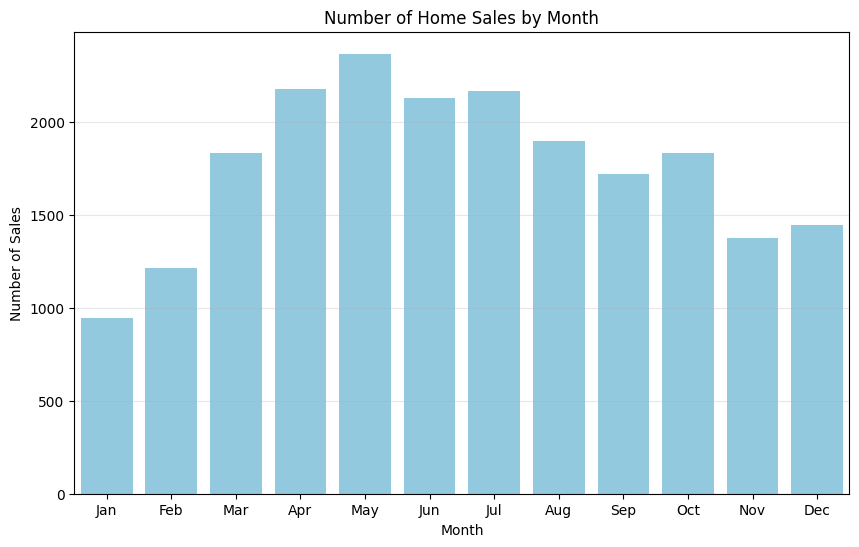

In [714]:
# Ensure 'sale_month' exists
df_king_county_import['date'] = pd.to_datetime(df_king_county_import['date'])
df_king_county_import['sale_month'] = df_king_county_import['date'].dt.month

# Aggregate number of unique sales per month
monthly_sales = (
    df_king_county_import.groupby('sale_month')['sales_id']
    .nunique()  # count unique sales IDs
    .reset_index(name='num_sales')  # name the column
)

# Create bar chart
plt.figure(figsize=(10,6))
sns.barplot(data=monthly_sales, x='sale_month', y='num_sales', color='skyblue')
plt.xlabel("Month")
plt.ylabel("Number of Sales")
plt.title("Number of Home Sales by Month")
plt.xticks(range(0,12), 
           ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.grid(True, alpha=0.3, axis='y')
plt.show()


The highest sales volumes are between March and October

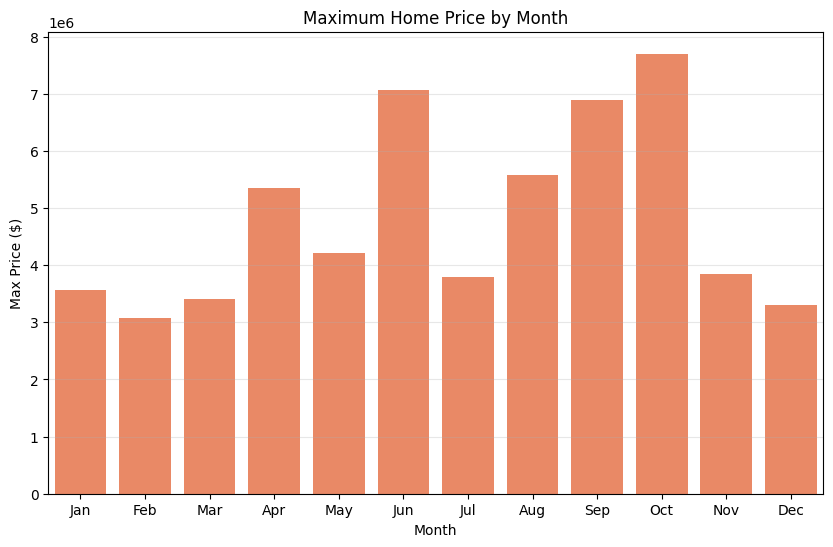

In [715]:
# Ensure 'sale_month' exists
df_king_county_import['date'] = pd.to_datetime(df_king_county_import['date'])
df_king_county_import['sale_month'] = df_king_county_import['date'].dt.month

# Aggregate average price per month
monthly_avg = df_king_county_import.groupby('sale_month')['price'].max().reset_index()

# Create bar chart
plt.figure(figsize=(10,6))
sns.barplot(data=monthly_avg, x='sale_month', y='price', color='coral')
plt.xlabel("Month")
plt.ylabel("Max Price ($)")
plt.title("Maximum Home Price by Month")
plt.xticks(range(0,12), 
           ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.grid(True, alpha=0.3, axis='y')
plt.show()


More expensive houses are sold between April and October.

In [716]:
import calendar
#  Count sales per month
sales_per_month = df_king_county_import['sale_month'].value_counts().sort_index()

# Find month with highest sales
max_month = sales_per_month.idxmax()
max_count = sales_per_month.max()
print(f"All homes: Month with highest sales is {calendar.month_name[max_month]} ({max_count} sales)")


All homes: Month with highest sales is May (2365 sales)


In [717]:
top_bucket = df_king_county_import['price_bucket'].max()
df_top = df_king_county_import[df_king_county_import['price_bucket'] == top_bucket]

sales_per_month_top = df_top['sale_month'].value_counts().sort_index()
max_month_top = sales_per_month_top.idxmax()
max_count_top = sales_per_month_top.max()
print(f"Top-priced homes: Month with highest sales is {calendar.month_name[max_month_top]} ({max_count_top} sales)")


Top-priced homes: Month with highest sales is April (396 sales)


In [718]:
df_king_county_import['sale_month'].describe()

count   21084.000
mean        6.576
std         3.114
min         1.000
25%         4.000
50%         6.000
75%         9.000
max        12.000
Name: sale_month, dtype: float64

# Recommendations

sell at any time of year (renovation time delay doesn’t impact)
renovation has positive impact on price (profit) on waterfront → high profit margin
buy houses with luxury grade and average quality (to improve after reno)

- select all houses where waterfront = yes, grade = luxury, quality = average


In [719]:
# list of houses to buy and renovate (luxury condition):
luxury_waterfront = df_king_county_import[
    (df_king_county_import['waterfront_imputed'] == 'Yes') &
    (df_king_county_import['grade_bucket'] == 'Luxury') &
    (df_king_county_import['condition_bucket'] == 'Average') &
    (df_king_county_import['yr_built'] < 1960)
]

print(luxury_waterfront.head(100))
print(luxury_waterfront.groupby('zipcode').size())


      bedrooms  bathrooms  sqft_living  sqft_lot  floors waterfront  view  condition  grade  sqft_above  sqft_basement  yr_built  yr_renovated  zipcode    lat     long  sqft_living15  sqft_lot15       date    price    house_id  sales_id  dist_to_waterfront waterfront_imputed condition_bucket grade_bucket    price_bucket  sqft_living_bucket  price_per_sqft  renovated  decade_built  waterfront_numeric  sale_month
3910         5          4        10040     37325       2        Yes     2          3     11        7680           2360      1940          2001    98004 47.650 -122.214           3930       25449 2014-06-11  7060000  9808700762      3911               0.000                Yes          Average       Luxury  Luxury (>750K)  Very Large (>4000)         703.187          1          1940                   1           6
4214         3          2         3280     29111       2        Yes     3          3     11        3280              0      1925          <NA>    98199 47.670 -122.416   

In [720]:
# list of houses to buy and renovate (good quality condition):

good_quality_waterfront = df_king_county_import[
    (df_king_county_import['waterfront_imputed'] == 'Yes') &
    (df_king_county_import['grade_bucket'] == 'Good Quality') &
    (df_king_county_import['condition_bucket'] == 'Average') &
    (df_king_county_import['yr_built'] < 1960)
]

print(good_quality_waterfront.head(100))
print(good_quality_waterfront.groupby('zipcode').size())

       bedrooms  bathrooms  sqft_living  sqft_lot  floors waterfront  view  condition  grade  sqft_above  sqft_basement  yr_built  yr_renovated  zipcode    lat     long  sqft_living15  sqft_lot15       date    price    house_id  sales_id  dist_to_waterfront waterfront_imputed condition_bucket  grade_bucket    price_bucket  sqft_living_bucket  price_per_sqft  renovated  decade_built  waterfront_numeric  sale_month
2862          3          3         5020     12431       2        Yes     4          3     10        3420           1600      1941          2002    98144 47.593 -122.287           3680       12620 2014-11-18  3600000  4114601570      2863               0.000                Yes          Average  Good Quality  Luxury (>750K)  Very Large (>4000)         717.131          1          1940                   1          11
6396          5          2         3750     91681       2        Yes     4          3     10        3750              0      1925          <NA>    98118 47.538 -122.2


Zip codes in your selected homes: [98033, 98040, 98118, 98136, 98144, 98166, 98040, 98199]


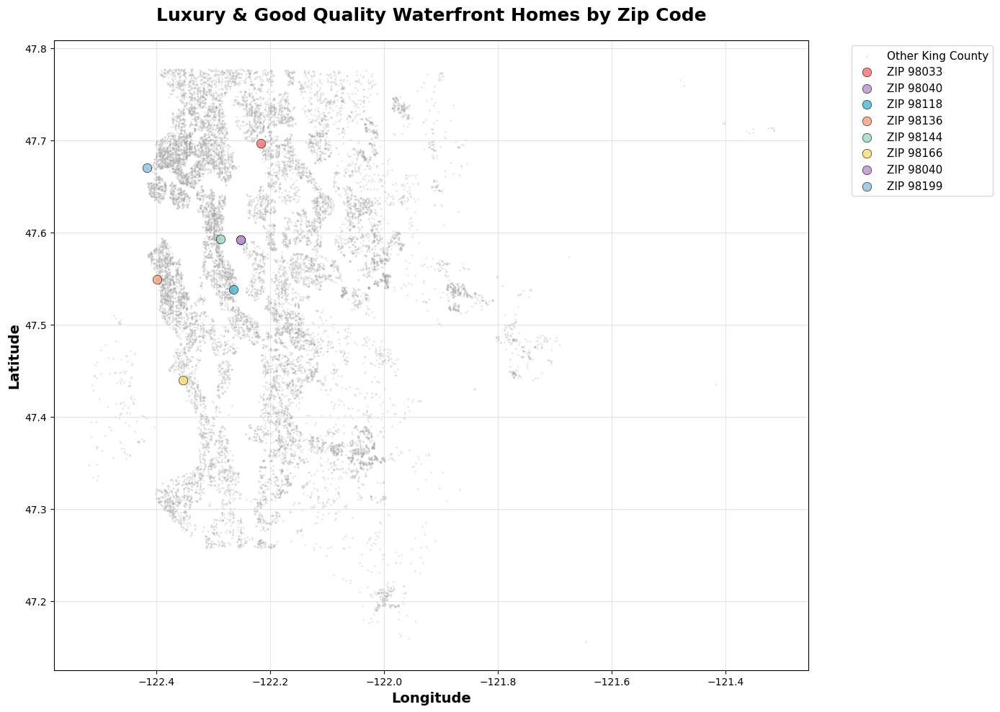

In [721]:
# overlay list of houses that could be bought & overlay over map of Seattle

selected_homes = pd.concat([luxury_waterfront, good_quality_waterfront])

print("\nZip codes in your selected homes:", your_zipcodes)

fig, ax = plt.subplots(figsize=(14, 10))

# Define enough colors for your zip codes
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A', '#98D8C8', '#F7DC6F', '#BB8FCE', '#85C1E2', '#E74C3C', '#52B788']

# Create a color mapping for each zipcode
zipcode_colors = {zipcode: colors[i % len(colors)] for i, zipcode in enumerate(your_zipcodes)}

# Plot ALL homes in King County (background - light gray)
ax.scatter(df_king_county_import['long'],
           df_king_county_import['lat'],
           c='darkgray',
           s=1,
           alpha=0.2,
           label='Other King County')

# Plot each zipcode with its assigned color (ONLY from your filtered homes)
for zipcode in your_zipcodes:
    zip_data = selected_homes[selected_homes['zipcode'] == zipcode]
    if len(zip_data) > 0:
        ax.scatter(zip_data['long'],
                   zip_data['lat'],
                   s=80,  # Larger dots since there are fewer homes
                   alpha=0.8,
                   color=zipcode_colors[zipcode],
                   label=f'ZIP {zipcode}',
                   edgecolors='black',
                   linewidth=0.5)

ax.set_xlabel('Longitude', fontsize=14, fontweight='bold')
ax.set_ylabel('Latitude', fontsize=14, fontweight='bold')
ax.set_title('Luxury & Good Quality Waterfront Homes by Zip Code', fontsize=18, fontweight='bold', pad=20)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, frameon=True)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [722]:
selected_homes = pd.concat([luxury_waterfront, good_quality_waterfront])

# Add a column to distinguish between luxury and good quality
luxury_waterfront_copy = luxury_waterfront.copy()
luxury_waterfront_copy['quality_level'] = 'Luxury'

good_quality_waterfront_copy = good_quality_waterfront.copy()
good_quality_waterfront_copy['quality_level'] = 'Good Quality'

# Combine with quality labels
selected_homes = pd.concat([luxury_waterfront_copy, good_quality_waterfront_copy])

# Convert zipcode to string for categorical colors
selected_homes['zipcode'] = selected_homes['zipcode'].astype(str)

fig = px.scatter_mapbox(
    selected_homes,
    lat="lat",
    lon="long",
    color="zipcode",  # Color by zip code
    hover_data={
        "price": ":$,.0f",
        "bedrooms": True,
        "bathrooms": True,
        "grade": True,
        "condition": True,
        "zipcode": True,
        "sqft_living": ":,.0f",
        "quality_level": True,
        "lat": False,
        "long": False
    },
    mapbox_style="carto-positron",
    zoom=10,
    height=700,
    title="Waterfront Homes by Zip Code"
)

fig.update_layout(
    font=dict(size=12),
    title_font_size=16
)

fig.show()

General overview of the whole (cleaned) dataset

In [723]:
# create scatterplot of all houses for sale
# Convert zipcode to string for categorical colors
df_king_county_import['zipcode'] = df_king_county_import['zipcode'].astype(str)

fig = px.scatter_mapbox(
    df_king_county_import,
    lat="lat",
    lon="long",
    color="zipcode",  # Color by zip code
    hover_data={
        "price": ":$,.0f",
        "bedrooms": True,
        "bathrooms": True,
        "grade": True,
        "condition": True,
        "zipcode": True,
        "sqft_living": ":,.0f",
        "waterfront_imputed": True,  # Add this instead
        "lat": False,
        "long": False
    },
    mapbox_style="carto-positron",
    zoom=10,
    height=700,
    title="All Houses in King County by Zip Code"
)

fig.update_layout(
    font=dict(size=12),
    showlegend=False,
    title_font_size=16
)

fig.show()

In [724]:
# calculate statistics of dataframe

df_king_county_import.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,date,price,house_id,sales_id,dist_to_waterfront,price_per_sqft,renovated,decade_built,waterfront_numeric,sale_month
count,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,722.000,21084.000,21084.000,21084.000,21084.000,21084,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000,21084.000
mean,3.372,2.060,2080.421,15076.672,1.534,0.233,3.410,7.658,1789.056,291.366,1971.021,1996.055,47.560,-122.214,1986.878,12731.839,2014-10-29 06:26:17.689243136,540274.872,4582998188.522,10796.866,0.063,264.152,0.034,1966.308,0.007,6.576
min,1.000,0.000,370.000,520.000,1.000,0.000,1.000,3.000,370.000,0.000,1900.000,1934.000,47.156,-122.519,399.000,651.000,2014-05-02 00:00:00,78000.000,1000102.000,1.000,0.000,87.588,0.000,1900.000,0.000,1.000
25%,3.000,2.000,1430.000,5040.000,1.000,0.000,3.000,7.000,1197.500,0.000,1952.000,1987.000,47.471,-122.328,1490.000,5100.000,2014-07-22 00:00:00,322000.000,2123537386.750,5387.500,0.022,182.267,0.000,1950.000,0.000,4.000
50%,3.000,2.000,1910.000,7620.000,2.000,0.000,3.000,7.000,1560.000,0.000,1975.000,2000.000,47.572,-122.230,1840.000,7626.000,2014-10-16 00:00:00,450000.000,3904970470.000,10798.500,0.041,244.669,0.000,1970.000,0.000,6.000
75%,4.000,2.000,2550.000,10697.250,2.000,0.000,4.000,8.000,2210.000,560.000,1997.000,2007.750,47.678,-122.125,2360.000,10088.250,2015-02-17 00:00:00,645000.000,7312250097.500,16211.250,0.071,318.085,0.000,1990.000,0.000,9.000
max,33.000,8.000,13540.000,1651359.000,4.000,4.000,5.000,13.000,9410.000,4820.000,2015.000,2015.000,47.778,-121.315,6210.000,871200.000,2015-05-27 00:00:00,7700000.000,9900000190.000,21597.000,0.758,810.139,1.000,2010.000,1.000,12.000
std,0.925,0.754,917.858,41171.542,0.554,0.765,0.651,1.174,828.421,442.000,29.325,15.441,0.139,0.141,685.523,27147.593,NaN,366719.888,2876602160.465,6237.476,0.068,110.128,0.182,29.375,0.082,3.114


In [725]:
# total number of houses
df_king_county_import['house_id'].count()

np.int64(21084)

In [726]:
# percentage of houses that have been renovated
renovation_rate = (df_king_county_import['yr_renovated'].notna().sum() / len(df_king_county_import)) * 100
print(f"Renovation rate: {renovation_rate:.2f}%")

Renovation rate: 3.42%


In [727]:
# percentage of houses at the waterfront
waterfront_pct = (df_king_county_import['waterfront_imputed'] == 'Yes').sum() / len(df_king_county_import) * 100
print(f"{waterfront_pct:.2f}% are waterfront")

0.67% are waterfront


In [728]:
# percentage of houses built before 1960
av_year_built = (df_king_county_import['yr_built'] < 1960).sum() / len(df_king_county_import) * 100
print(f"{av_year_built:.2f}% are built before 1960")

34.15% are built before 1960
